In [1]:
import pandas as pd
import datetime
from joblib import dump, load

import matplotlib.pyplot as plt
import numpy as np
from matplotlib import colors
from matplotlib.ticker import PercentFormatter

import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import TimeSeriesSplit as tss
from sklearn import metrics

In [2]:
%config IPCompleter.greedy = True

In [3]:
# pd.set_option('display.max_rows', 500)
# pd.set_option('display.max_columns', 100)

In [4]:
# We use sql to get the January data from 2018. And I save the January data as a csv file.

# Load the Jan data

In [5]:
df1 = pd.read_csv("jan_data.csv")

In [6]:
#add column features (to modify the little error of sql )
#https://zhuanlan.zhihu.com/p/341400424
df1.columns = ['dayofservice','tripid','lineid','planned_arr_T','planned_dep_T',
                  'arrival_time_T','departure_time_T','progrnumber','stoppointid','planned_arr_L','planned_dep_L','arrival_time_L','departure_time_L','vehicleid','lastupdate']

In [7]:
#add a row at the top in Pandas dataframe
#https://re-thought.com/how-to-add-a-row-at-the-top-in-pandas-dataframe/

In [8]:
# way of adding a row to the top of Pandas dataframe
df1.loc[-1] = ['2018-01-06 00:00:00', 5955221, '14', 42553, 37800, '42078','37836', 7,234, 38205, 38205.1, 38205.2,38231, 2693254,'2018-01-15 08:25:25'] 
# adding a row
df1.index = df1.index + 1  # shifting index
df1.sort_index(inplace=True)

In [9]:
df1.head(5)

,dayofservice,tripid,lineid,planned_arr_T,planned_dep_T,arrival_time_T,departure_time_T,progrnumber,stoppointid,planned_arr_L,planned_dep_L,arrival_time_L,departure_time_L,vehicleid,lastupdate
0,2018-01-06 00:00:00,5955221,14,42553,37800,42078,37836,7,234,38205,38205.1,38205.2,38231,2693254,2018-01-15 08:25:25
1,2018-01-06 00:00:00,5955221,14,42553,37800,42078,37836,8,235,38271,38271.0,38256.0,38256,2693254,2018-01-15 08:25:25
2,2018-01-06 00:00:00,5955221,14,42553,37800,42078,37836,45,1081,40979,40979.0,40652.0,40672,2693254,2018-01-15 08:25:25
3,2018-01-06 00:00:00,5955221,14,42553,37800,42078,37836,46,2914,41021,41021.0,40719.0,40731,2693254,2018-01-15 08:25:25
4,2018-01-06 00:00:00,5955221,14,42553,37800,42078,37836,47,2989,41096,41096.0,40788.0,40788,2693254,2018-01-15 08:25:25


In [10]:
df1.tail(5)

,dayofservice,tripid,lineid,planned_arr_T,planned_dep_T,arrival_time_T,departure_time_T,progrnumber,stoppointid,planned_arr_L,planned_dep_L,arrival_time_L,departure_time_L,vehicleid,lastupdate
10524999,2018-01-31 00:00:00,6245816,46A,28500,25800,28226,25779,24,906,27420,27420.0,27157.0,27197,1000485,2018-02-08 14:17:10
10525000,2018-01-31 00:00:00,6245816,46A,28500,25800,28226,25779,29,792,27840,27840.0,27608.0,27640,1000485,2018-02-08 14:17:10
10525001,2018-01-31 00:00:00,6245816,46A,28500,25800,28226,25779,31,320,28085,28085.0,27914.0,27963,1000485,2018-02-08 14:17:10
10525002,2018-01-31 00:00:00,6245816,46A,28500,25800,28226,25779,25,907,27465,27465.0,27221.0,27221,1000485,2018-02-08 14:17:10
10525003,2018-01-31 00:00:00,6245816,46A,28500,25800,28226,25779,33,278,28370,28370.0,28143.0,28178,1000485,2018-02-08 14:17:10


#### the number of rows and columns of Jan data

In [11]:
print("Rows:",df1.shape[0])
print("Columns:",df1.shape[1])

Rows: 10525004
Columns: 15


The dataset has a total of 10525004 rows and 15 columns .

#### Check for duplicate rows/columns

In [12]:
print('duplicate rows: ', df1.duplicated().sum())

duplicate rows:  0


In [13]:
#check again
print('duplicate rows:', df1[df1.duplicated(keep=False)].shape[0])

duplicate rows: 0


I wouldn't check for duplicate columns because the dataset is too big.

#### the datatype of each column

In [14]:
# to modify the continuous or categorical columns (later)
df1.dtypes

dayofservice         object
tripid                int64
lineid               object
planned_arr_T         int64
planned_dep_T         int64
arrival_time_T       object
departure_time_T     object
progrnumber           int64
stoppointid           int64
planned_arr_L         int64
planned_dep_L       float64
arrival_time_L      float64
departure_time_L      int64
vehicleid             int64
lastupdate           object
dtype: object

##### continuous features (int 64 & float 64)

#####  dayofservice (object ---> int64)
#####  lineid (object ---> categorical)
#####  arrival_time_T (object ---> float64)
#####  departure_time_T (object ---> float64)

#####  lastupdate (object ---> int64)

In [15]:
categorical_columns = df1[['lineid']].columns
continuous_columns = df1[['planned_arr_T','planned_dep_T','arrival_time_T','departure_time_T','progrnumber','stoppointid','planned_arr_L','planned_dep_L','arrival_time_L','departure_time_L','vehicleid','tripid']].columns
datetime_columns = df1[['dayofservice', 'lastupdate']].columns

for column in categorical_columns:
    df1[column] = df1[column].astype('category')  

for column in datetime_columns:
    df1[column] = pd.to_datetime(df1[column]).astype('int64')  
    
df1.dtypes

dayofservice           int64
tripid                 int64
lineid              category
planned_arr_T          int64
planned_dep_T          int64
arrival_time_T        object
departure_time_T      object
progrnumber            int64
stoppointid            int64
planned_arr_L          int64
planned_dep_L        float64
arrival_time_L       float64
departure_time_L       int64
vehicleid              int64
lastupdate             int64
dtype: object

In [16]:
#https://stackoverflow.com/questions/28277137/how-to-convert-datatypeobject-to-float64-in-python
df1 = df1.convert_objects(convert_numeric=True)
df1.dtypes

/home/team12/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  


dayofservice           int64
tripid                 int64
lineid              category
planned_arr_T          int64
planned_dep_T          int64
arrival_time_T       float64
departure_time_T     float64
progrnumber            int64
stoppointid            int64
planned_arr_L          int64
planned_dep_L        float64
arrival_time_L       float64
departure_time_L       int64
vehicleid              int64
lastupdate             int64
dtype: object

In [17]:
# Get the number of unique values for all features
df1.nunique()

dayofservice           31
tripid              76453
lineid                126
planned_arr_T       31039
planned_dep_T         719
arrival_time_T      59688
departure_time_T    49881
progrnumber           103
stoppointid          4714
planned_arr_L       68859
planned_dep_L       68860
arrival_time_L      71983
departure_time_L    71965
vehicleid             996
lastupdate             31
dtype: int64

#### check the data

In [18]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
dayofservice,10525004.0,1.516073e+18,7.680967e+14,1.514765e+18,1.515456e+18,1.516061e+18,1.516752e+18,1.517357e+18
tripid,10525004.0,6.121299e+06,9.382799e+04,5.955221e+06,6.092956e+06,6.111909e+06,6.219260e+06,6.245816e+06
planned_arr_T,10525004.0,5.558728e+04,1.726703e+04,1.843200e+04,4.036700e+04,5.602300e+04,6.949900e+04,9.121700e+04
planned_dep_T,10525004.0,5.161347e+04,1.747011e+04,1.620000e+04,3.660000e+04,5.178000e+04,6.540000e+04,8.760000e+04
arrival_time_T,10006992.0,5.537709e+04,1.711519e+04,1.781400e+04,4.025400e+04,5.568300e+04,6.917200e+04,9.309200e+04
departure_time_T,9863339.0,5.182588e+04,1.738701e+04,1.630000e+04,3.690100e+04,5.214700e+04,6.542400e+04,8.884300e+04
progrnumber,10525004.0,3.116223e+01,1.998223e+01,1.000000e+00,1.500000e+01,2.900000e+01,4.500000e+01,1.030000e+02
stoppointid,10525004.0,2.507552e+03,2.007388e+03,2.000000e+00,9.480000e+02,1.989000e+03,3.712000e+03,7.667000e+03
planned_arr_L,10525004.0,5.361669e+04,1.740743e+04,1.620000e+04,3.843300e+04,5.391700e+04,6.752600e+04,9.121700e+04
planned_dep_L,10525004.0,5.361669e+04,1.740743e+04,1.620000e+04,3.843300e+04,5.391700e+04,6.752600e+04,9.121700e+04


#### check the data (Continuous features)

In [19]:
# Specify the continuous columns set
continuous_columns = df1.select_dtypes(['float64', 'int64']).columns
continuous_columns

Index(['dayofservice', 'tripid', 'planned_arr_T', 'planned_dep_T',
       'arrival_time_T', 'departure_time_T', 'progrnumber', 'stoppointid',
       'planned_arr_L', 'planned_dep_L', 'arrival_time_L', 'departure_time_L',
       'vehicleid', 'lastupdate'],
      dtype='object')

In [20]:
df1[continuous_columns].head()

,dayofservice,tripid,planned_arr_T,planned_dep_T,arrival_time_T,departure_time_T,progrnumber,stoppointid,planned_arr_L,planned_dep_L,arrival_time_L,departure_time_L,vehicleid,lastupdate
0,1515196800000000000,5955221,42553,37800,42078.0,37836.0,7,234,38205,38205.1,38205.2,38231,2693254,1516004725000000000
1,1515196800000000000,5955221,42553,37800,42078.0,37836.0,8,235,38271,38271.0,38256.0,38256,2693254,1516004725000000000
2,1515196800000000000,5955221,42553,37800,42078.0,37836.0,45,1081,40979,40979.0,40652.0,40672,2693254,1516004725000000000
3,1515196800000000000,5955221,42553,37800,42078.0,37836.0,46,2914,41021,41021.0,40719.0,40731,2693254,1516004725000000000
4,1515196800000000000,5955221,42553,37800,42078.0,37836.0,47,2989,41096,41096.0,40788.0,40788,2693254,1516004725000000000


In [21]:
# Analyse the summary stats table for continuous features
df1[continuous_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
dayofservice,10525004.0,1.516073e+18,7.680967e+14,1.514765e+18,1.515456e+18,1.516061e+18,1.516752e+18,1.517357e+18
tripid,10525004.0,6.121299e+06,9.382799e+04,5.955221e+06,6.092956e+06,6.111909e+06,6.219260e+06,6.245816e+06
planned_arr_T,10525004.0,5.558728e+04,1.726703e+04,1.843200e+04,4.036700e+04,5.602300e+04,6.949900e+04,9.121700e+04
planned_dep_T,10525004.0,5.161347e+04,1.747011e+04,1.620000e+04,3.660000e+04,5.178000e+04,6.540000e+04,8.760000e+04
arrival_time_T,10006992.0,5.537709e+04,1.711519e+04,1.781400e+04,4.025400e+04,5.568300e+04,6.917200e+04,9.309200e+04
departure_time_T,9863339.0,5.182588e+04,1.738701e+04,1.630000e+04,3.690100e+04,5.214700e+04,6.542400e+04,8.884300e+04
progrnumber,10525004.0,3.116223e+01,1.998223e+01,1.000000e+00,1.500000e+01,2.900000e+01,4.500000e+01,1.030000e+02
stoppointid,10525004.0,2.507552e+03,2.007388e+03,2.000000e+00,9.480000e+02,1.989000e+03,3.712000e+03,7.667000e+03
planned_arr_L,10525004.0,5.361669e+04,1.740743e+04,1.620000e+04,3.843300e+04,5.391700e+04,6.752600e+04,9.121700e+04
planned_dep_L,10525004.0,5.361669e+04,1.740743e+04,1.620000e+04,3.843300e+04,5.391700e+04,6.752600e+04,9.121700e+04


In [22]:
# Prepare %missing column
continuous_columns_missing  = 100 * (df1[continuous_columns].isnull().sum()/df1.shape[0])
# store the values in a dataframe to be added to the 
df1_continuous_missing = pd.DataFrame(continuous_columns_missing, columns=['%missing'])
df1_continuous_missing

,%missing
dayofservice,0.000000
tripid,0.000000
planned_arr_T,0.000000
planned_dep_T,0.000000
arrival_time_T,4.921727
departure_time_T,6.286601
progrnumber,0.000000
stoppointid,0.000000
planned_arr_L,0.000000
planned_dep_L,0.000000


#### check the data (Categorical features)

In [23]:
# Summary stats table for categorical features
df1_table_categorical = df1[categorical_columns].describe().T
df1_table_categorical

,count,unique,top,freq
lineid,10525004,126,46A,400587


In [24]:
# Prepare %missing column
categorical_columns_perc_missing  = 100 * (df1[categorical_columns].isnull().sum()/df1.shape[0])
#category_columns_perc_missing

In [25]:
# Prepare the cardinality column
category_columns_card = df1[categorical_columns].nunique()
# store the values in a dataframe
df1_category_card = pd.DataFrame(category_columns_card, columns=['card'])
df1_category_card

,card
lineid,126


In [26]:
# Look at the values taken by each categorical feature, excluding the NaN values.
for column in categorical_columns:
    print("\n" + column)
    print(df1[column].value_counts(dropna=True))


lineid
46A    400587
40     396414
145    379773
27     365694
15     345396
39A    335409
13     306343
16     304484
9      246191
14     230956
77A    203757
123    201323
83     186226
4      182729
130    180400
37     170712
122    170658
17A    167811
75     167596
39     162465
41     156082
41C    150891
11     146943
18     145788
151    140927
140    140865
15B    138775
67     137480
33     134727
29A    127921
        ...  
7B      10749
41X      7720
44B      5760
16C      5648
76A      5032
51D      5006
25D      4657
25X      4602
68A      4554
39X      4460
32X      3975
27X      3809
161      3628
14C      3323
236      3000
15D      2473
7D       2395
41A      2353
116      2228
118      1769
70D      1636
46E      1618
31D      1496
77X      1404
42D      1376
38D      1154
51X      1039
68X       837
69X       786
33D       137
Name: lineid, Length: 126, dtype: int64


#### Missing data

In [27]:
df1.isnull().sum()

dayofservice             0
tripid                   0
lineid                   0
planned_arr_T            0
planned_dep_T            0
arrival_time_T      518012
departure_time_T    661665
progrnumber              0
stoppointid              0
planned_arr_L            0
planned_dep_L            0
arrival_time_L           0
departure_time_L         0
vehicleid                0
lastupdate               0
dtype: int64

In [28]:
columns_perc_missing  = 100 * (df1.isnull().sum()/df1.shape[0])

In [29]:
df_perc_missing = pd.DataFrame(columns_perc_missing, columns=['%missing'])
df_perc_missing

,%missing
dayofservice,0.000000
tripid,0.000000
lineid,0.000000
planned_arr_T,0.000000
planned_dep_T,0.000000
arrival_time_T,4.921727
departure_time_T,6.286601
progrnumber,0.000000
stoppointid,0.000000
planned_arr_L,0.000000


#### we use the 2018 data for the ML

There are many differences between 2018 data and 2022 data.

When the routes only exist in the 2018 data (not in the 2022 data), I decide to ignore the changes.

#### use a smaller sample of the data to explore the data features

In [30]:
df1_sample = df1.sample(n=10000, random_state=1)

## continuous

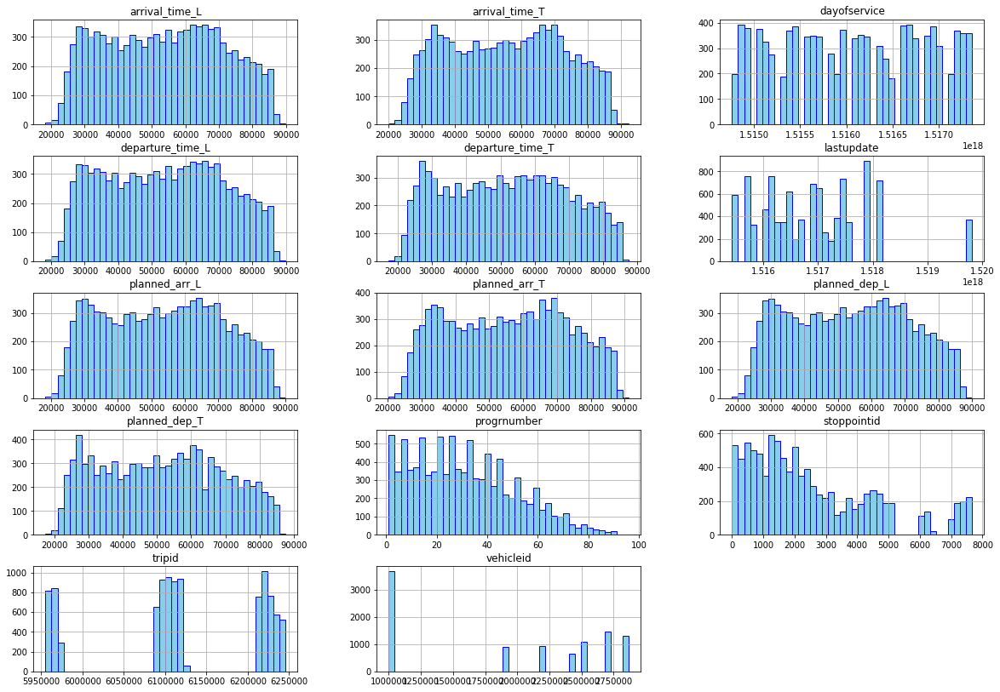

In [31]:
#https://stackoverflow.com/questions/42172440/python-matplotlib-histogram-color
#https://matplotlib.org/stable/gallery/statistics/hist.html
df1_sample[continuous_columns].hist(layout=(7, 3), figsize=(20,20), bins=40,color = "skyblue", ec="blue")
plt.show()

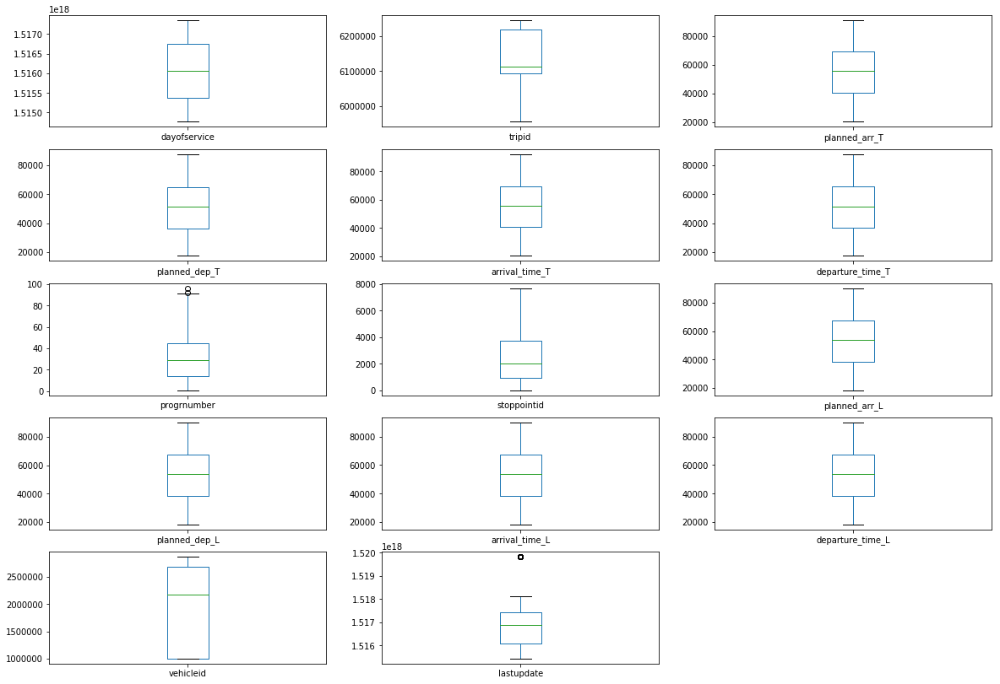

In [32]:
df1_sample[continuous_columns].dropna().astype('int64').plot(kind='box', subplots=True, figsize=(20,20), layout=(7,3), sharex=False, sharey=False)
plt.show()

the pairwise correlation of all columns in the sample dataframe

na values are automatically excluded

non-numeric data type columns in the dataframe it is ignored

In [33]:
corr = df1_sample[continuous_columns].corr()
corr

,dayofservice,tripid,planned_arr_T,planned_dep_T,arrival_time_T,departure_time_T,progrnumber,stoppointid,planned_arr_L,planned_dep_L,arrival_time_L,departure_time_L,vehicleid,lastupdate
dayofservice,1.000000,0.942983,-0.015674,-0.012708,-0.001573,-0.014040,0.013423,-0.008942,-0.014138,-0.014138,-0.006904,-0.006890,-0.003812,0.937821
tripid,0.942983,1.000000,-0.008548,-0.005417,0.007338,-0.005965,0.009043,-0.010029,-0.007162,-0.007162,0.000138,0.000140,-0.001701,0.873097
planned_arr_T,-0.015674,-0.008548,1.000000,0.997375,0.999362,0.997291,0.006237,0.007254,0.996716,0.996716,0.996406,0.996412,0.064371,-0.015672
planned_dep_T,-0.012708,-0.005417,0.997375,1.000000,0.996825,0.999939,-0.017475,0.008712,0.996677,0.996677,0.996478,0.996474,0.055235,-0.013385
arrival_time_T,-0.001573,0.007338,0.999362,0.996825,1.000000,0.996820,0.003228,0.006497,0.996106,0.996106,0.996329,0.996338,0.061737,-0.002950
departure_time_T,-0.014040,-0.005965,0.997291,0.999939,0.996820,1.000000,-0.018591,0.009221,0.996578,0.996578,0.996461,0.996457,0.055702,-0.015852
progrnumber,0.013423,0.009043,0.006237,-0.017475,0.003228,-0.018591,1.000000,-0.013650,0.058029,0.058029,0.058540,0.058525,0.059270,0.015483
stoppointid,-0.008942,-0.010029,0.007254,0.008712,0.006497,0.009221,-0.013650,1.000000,0.008170,0.008170,0.008245,0.008147,-0.039132,-0.006346
planned_arr_L,-0.014138,-0.007162,0.996716,0.996677,0.996106,0.996578,0.058029,0.008170,1.000000,1.000000,0.999755,0.999753,0.059607,-0.014277
planned_dep_L,-0.014138,-0.007162,0.996716,0.996677,0.996106,0.996578,0.058029,0.008170,1.000000,1.000000,0.999755,0.999753,0.059607,-0.014277


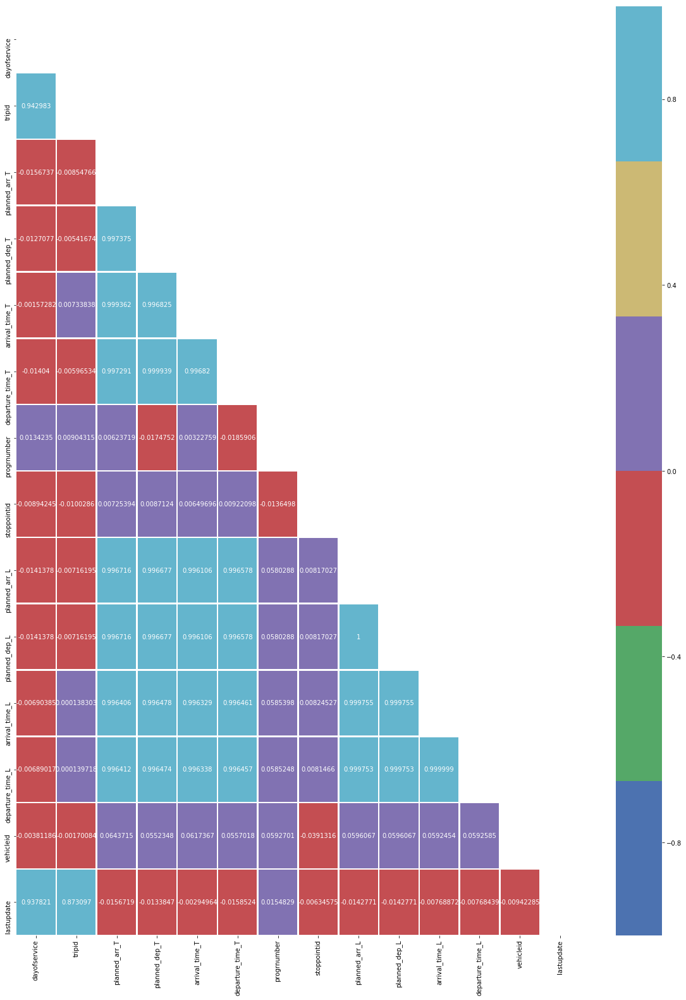

In [34]:
# https://seaborn.pydata.org/tutorial/color_palettes.html
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize = (20,27))
# tab10
# deep, 
# muted, 
# pastel, 
# bright, 
# dark, 
# colorblind
color = sns.color_palette("deep",6)
sns.heatmap(corr, cmap=color, annot=True, fmt='g', vmax=1, vmin=-1,linewidths=1.5, mask=mask)

/home/team12/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


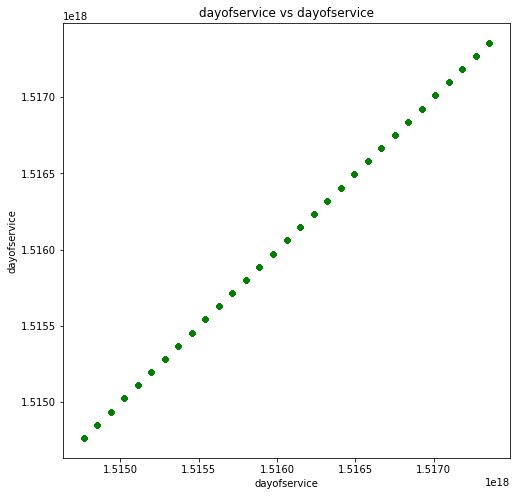

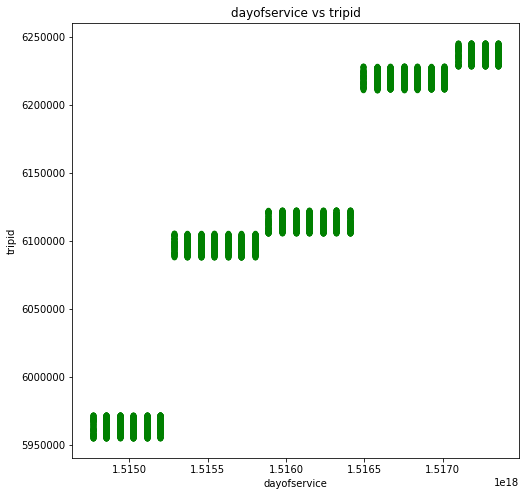

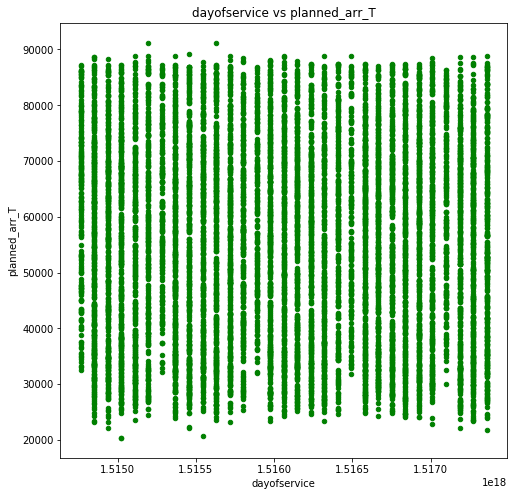

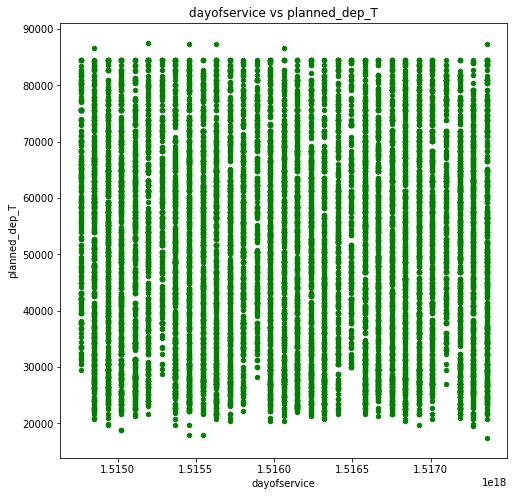

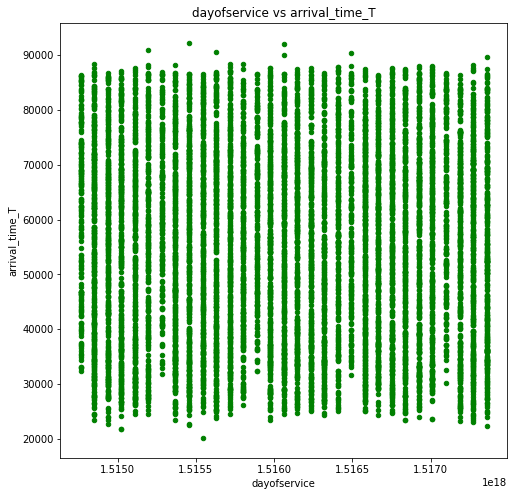

...

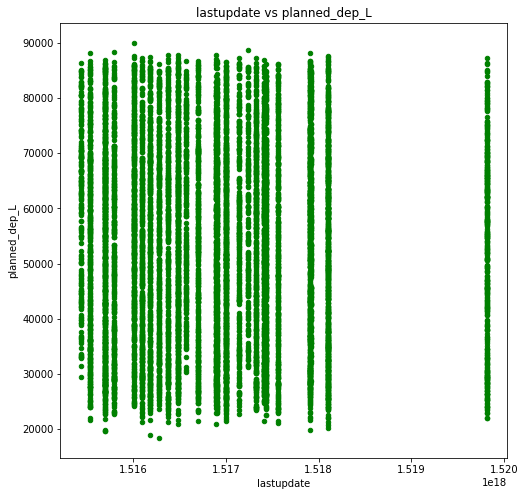

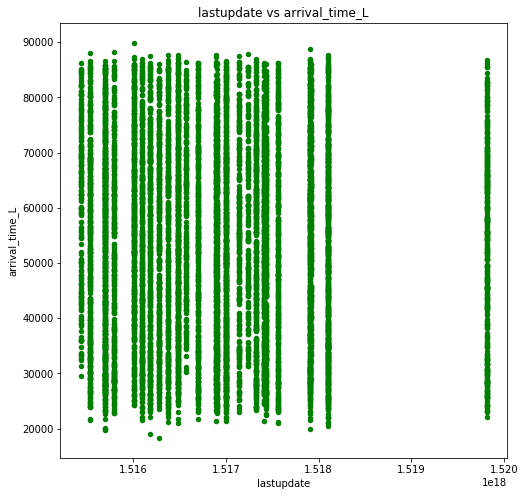

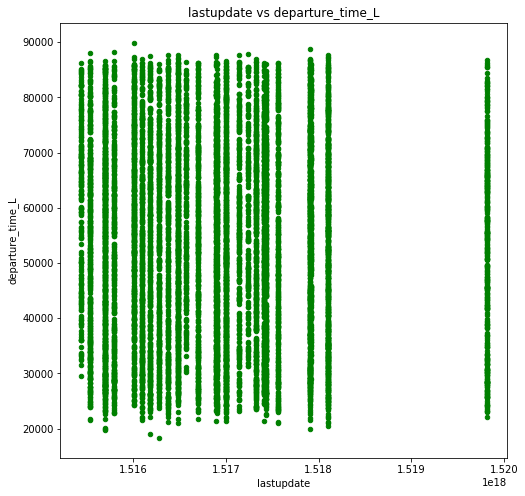

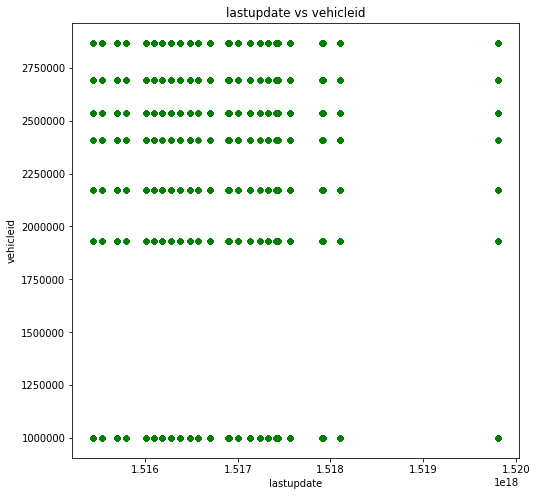

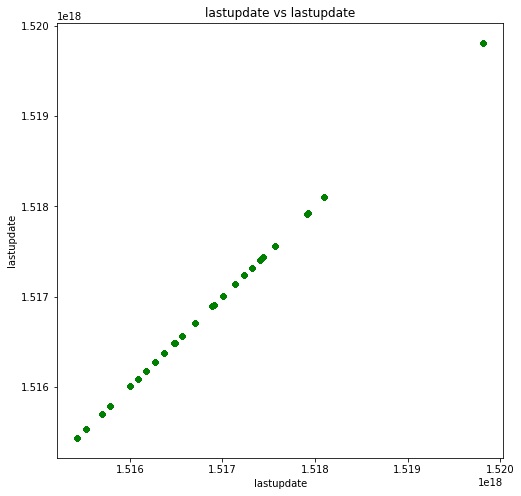

In [35]:
for feature in continuous_columns:
    for feature_ in continuous_columns:
        df1_sample.plot(kind='scatter', x=feature, y=feature_, color="g", figsize=(8,8), title=f"{feature} vs {feature_}")

In [36]:
df1.dtypes

dayofservice           int64
tripid                 int64
lineid              category
planned_arr_T          int64
planned_dep_T          int64
arrival_time_T       float64
departure_time_T     float64
progrnumber            int64
stoppointid            int64
planned_arr_L          int64
planned_dep_L        float64
arrival_time_L       float64
departure_time_L       int64
vehicleid              int64
lastupdate             int64
dtype: object

### datofservice & lastupdate

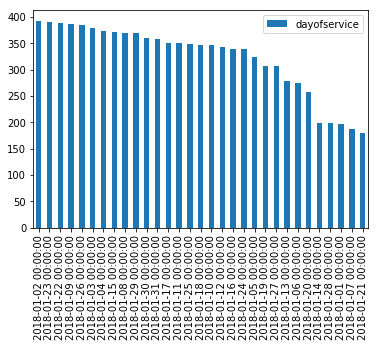

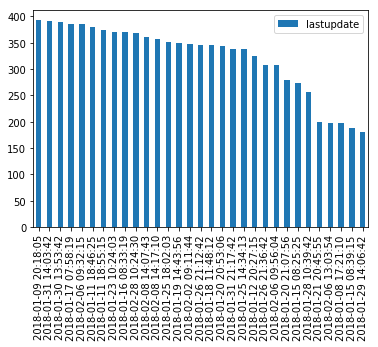

In [37]:
for col in datetime_columns:
    dates = pd.DataFrame(df1_sample[col].astype("datetime64[ns]").value_counts())
    dates.plot(kind="bar")
    plt.show()

## categorical

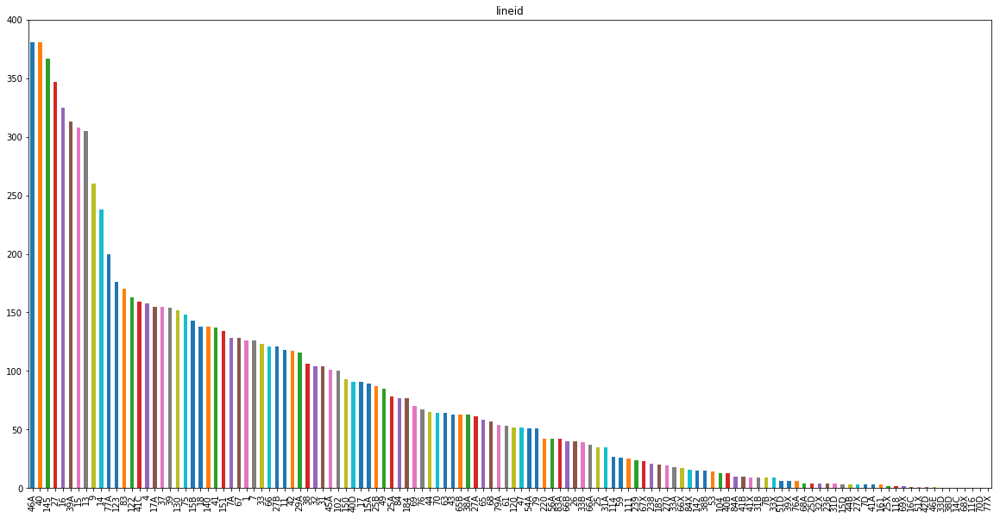

In [38]:
for col in categorical_columns:
    f = df1_sample[col].value_counts().plot(kind='bar', figsize=(20,10))
    plt.title(col)
    plt.show()

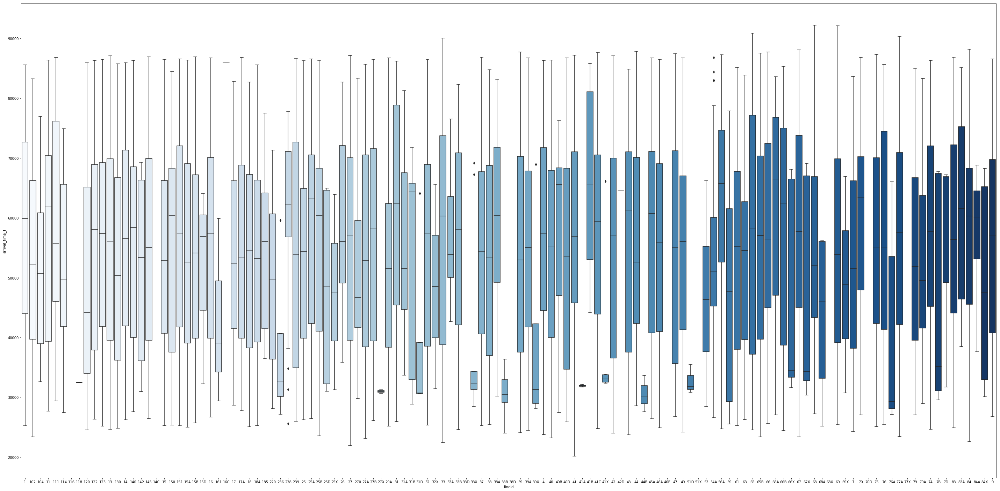

In [39]:
#https://www.python-graph-gallery.com/33-control-colors-of-boxplot-seaborn
#Blues
for feature in categorical_columns: 
    plt.figure(figsize=(50,25))
    sns.boxplot(data=df1_sample[[feature,"arrival_time_T"]], palette="Blues",x=feature, y="arrival_time_T")
    plt.show()

### data integrity

check time

still working

In [40]:
df1.dtypes

dayofservice           int64
tripid                 int64
lineid              category
planned_arr_T          int64
planned_dep_T          int64
arrival_time_T       float64
departure_time_T     float64
progrnumber            int64
stoppointid            int64
planned_arr_L          int64
planned_dep_L        float64
arrival_time_L       float64
departure_time_L       int64
vehicleid              int64
lastupdate             int64
dtype: object